# Table of Contents
 <p><div class="lev2"><a href="#Des-Moines"><span class="toc-item-num">0.1&nbsp;&nbsp;</span>Des Moines</a></div>

In [1]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
# plt.rc("figure", autolayout=True)
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (8.0, 6.0)

In [2]:
import geopandas as gpd
import pandas as pd
import numpy as np
import shapely
import zipfile
plot_dataframe = gpd.plotting.plot_dataframe
Point = shapely.geometry.Point

In [3]:
schdistrs=gpd.read_file("national_data/Tiger/tlgdb_2015_a_us_school.gdb/a00000009.gdbtable")

In [5]:
cities=gpd.read_file("national_data/Place_2010Census_DP1/Place_2010Census_DP1.shp").to_crs(schdistrs.crs)

In [6]:
cities.shape

(29514, 198)

In [7]:
# cities=pd.concat(cities_dfs)
cities=cities.iloc[cities.DP0010001.argsort()[::-1]]

City with the highest population:

In [8]:
c=cities.iloc[0]
c.NAMELSAD10

'New York city'

Find number of districts for the 200 most populated cities in the US.

In [9]:
milwaukee=cities[cities.NAMELSAD10=="Milwaukee city"]
milwaukee.NAMELSAD10

28444    Milwaukee city
Name: NAMELSAD10, dtype: object

In [11]:
def city_schdistrs(city):
    intersect = schdistrs[schdistrs.intersects(city)]
    areas = intersect.intersection(city).area
    # throw out districts that aren't at least a thousandth of the city's surface area
    nonzero_area = areas > (city.area/1000)
    return intersect[nonzero_area] 

(42.699999999999996, 43.399999999999999)

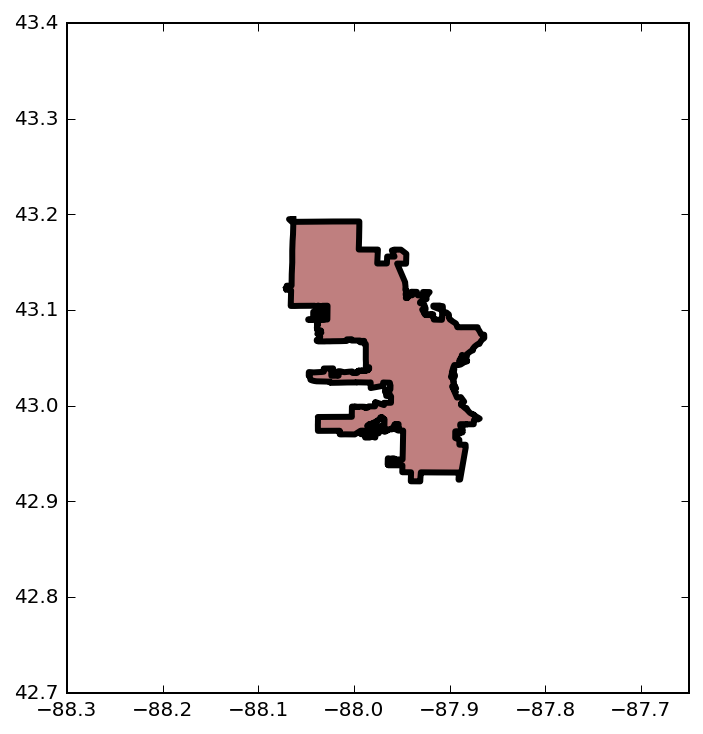

In [12]:
plot_dataframe(milwaukee, color="white", linewidth=3)
old_xlim = plt.xlim()
old_ylim = plt.ylim()
plot_dataframe(city_schdistrs(milwaukee.geometry.values[0]), ax=plt.gca())
plt.xlim(old_xlim[0]-0.2,old_xlim[1]+0.2)
plt.ylim(old_ylim[0]-0.2,old_ylim[1]+0.2)

In [13]:
ndistricts = [len(city_schdistrs(c)) for c in cities.geometry.values[:200]]

In [14]:
ndistricts

[1,
 2,
 1,
 22,
 1,
 5,
 14,
 4,
 18,
 3,
 1,
 9,
 1,
 9,
 16,
 16,
 1,
 1,
 4,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 9,
 1,
 19,
 1,
 7,
 6,
 5,
 4,
 14,
 4,
 1,
 1,
 9,
 5,
 2,
 1,
 4,
 7,
 4,
 1,
 11,
 1,
 5,
 0,
 2,
 1,
 3,
 1,
 6,
 4,
 1,
 2,
 9,
 5,
 1,
 1,
 1,
 5,
 5,
 1,
 1,
 1,
 1,
 4,
 2,
 1,
 4,
 1,
 1,
 0,
 1,
 1,
 3,
 2,
 8,
 1,
 6,
 1,
 1,
 5,
 3,
 1,
 1,
 1,
 1,
 4,
 1,
 5,
 2,
 7,
 2,
 1,
 4,
 4,
 4,
 1,
 2,
 2,
 1,
 8,
 1,
 2,
 2,
 6,
 4,
 7,
 1,
 3,
 1,
 1,
 1,
 2,
 3,
 1,
 5,
 1,
 1,
 1,
 5,
 3,
 1,
 1,
 1,
 1,
 3,
 1,
 1,
 1,
 1,
 6,
 5,
 5,
 4,
 2,
 0,
 1,
 3,
 1,
 1,
 1,
 1,
 3,
 2,
 5,
 1,
 0,
 3,
 1,
 2,
 1,
 5,
 6,
 1,
 2,
 4,
 1,
 2,
 0,
 3,
 4,
 3,
 1,
 4,
 2,
 1,
 1,
 6,
 2,
 2,
 1,
 5,
 8,
 1,
 1,
 1,
 3,
 1,
 1,
 2,
 2,
 1,
 2,
 2,
 6,
 2,
 1,
 6,
 5,
 1,
 2,
 1,
 3]

In [15]:
ndist_df=pd.DataFrame({"NAME": cities.NAMELSAD10[:200], "NDISTS": ndistricts})

In [45]:
ndist_df.sort("NDISTS", ascending=False, inplace=True)

/Users/imolk/bin/venv_python3/lib/python3.5/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


In [17]:
ndist_df.to_csv("ndist.csv")

/Users/imolk/bin/venv_python3/lib/python3.5/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


# Plot cities

In [39]:
def simplename(s):
    return (s
        .replace("District","")
        .replace("School","")
        .replace("Community","")
        .replace("Independent","")
        .strip()
    )
def plot_city(city):
    plot_dataframe(city, color="white", linewidth=3)
    old_xlim = plt.xlim()
    old_ylim = plt.ylim()
    schdistrs = city_schdistrs(city.geometry.values[0])
    plot_dataframe(schdistrs, ax=plt.gca())
    plt.xlim(old_xlim[0]-0.1,old_xlim[1]+0.1)
    plt.ylim(old_ylim[0]-0.1,old_ylim[1]+0.1)

    for row in schdistrs.iterrows():
        name = row[1].NAME
        geom = row[1].geometry
        x = geom.centroid.x
        y = geom.centroid.y
        plt.text(np.clip(x,*plt.xlim()), np.clip(y,*plt.ylim()), simplename(name), horizontalalignment='center')

## Des Moines

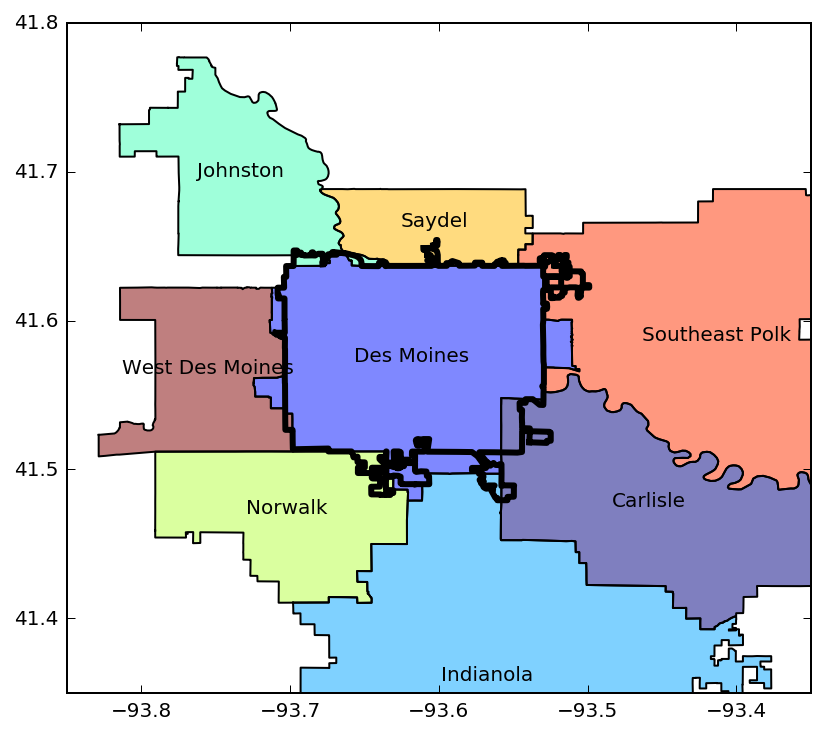

In [40]:
desmoines=cities[cities.NAMELSAD10=="Des Moines city"].iloc[0:1]
desmoines.NAMELSAD10
plot_city(desmoines)

## Milwaukee

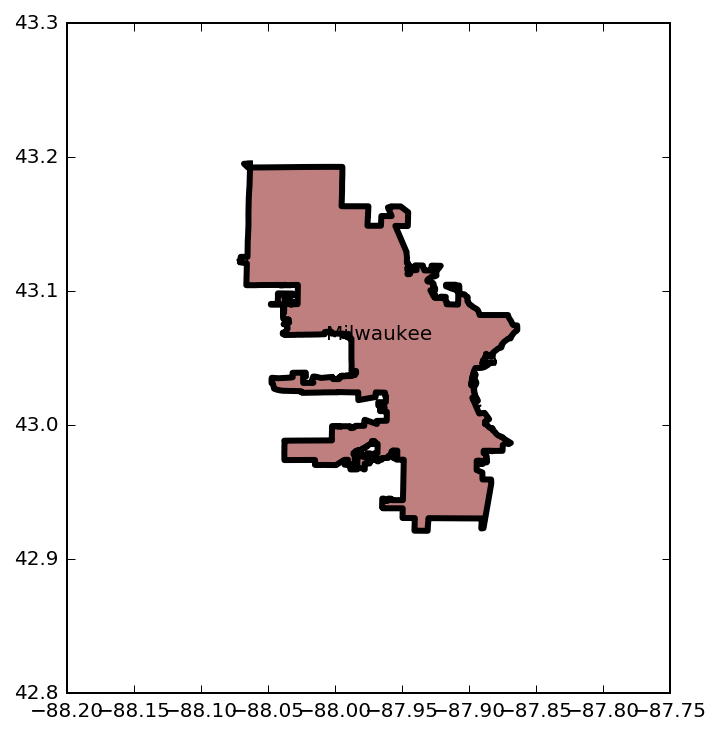

In [25]:
plot_city(milwaukee)

## Madison

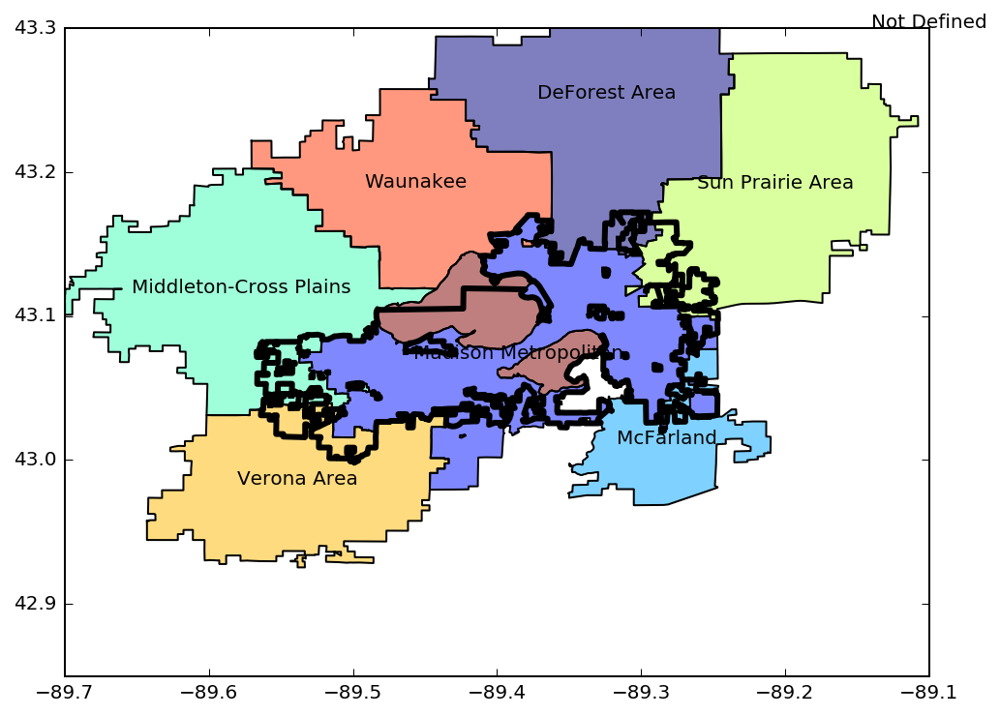

In [41]:
madison=cities[cities.NAMELSAD10=="Madison city"].iloc[0:1]
plot_city(madison)

## All

/Users/imolk/bin/venv_python3/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


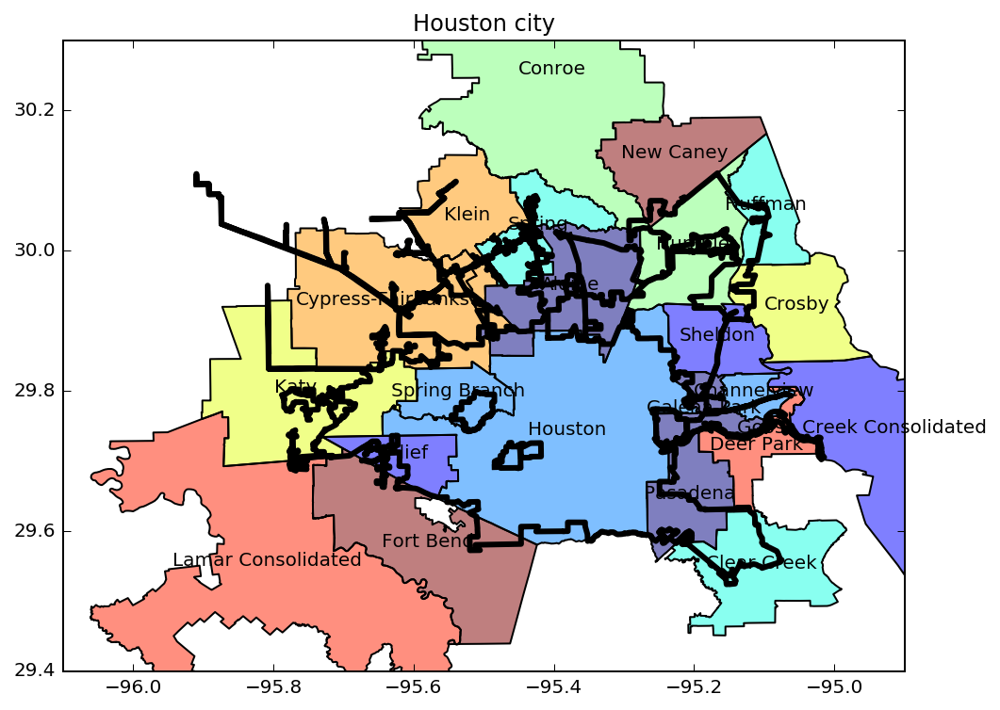

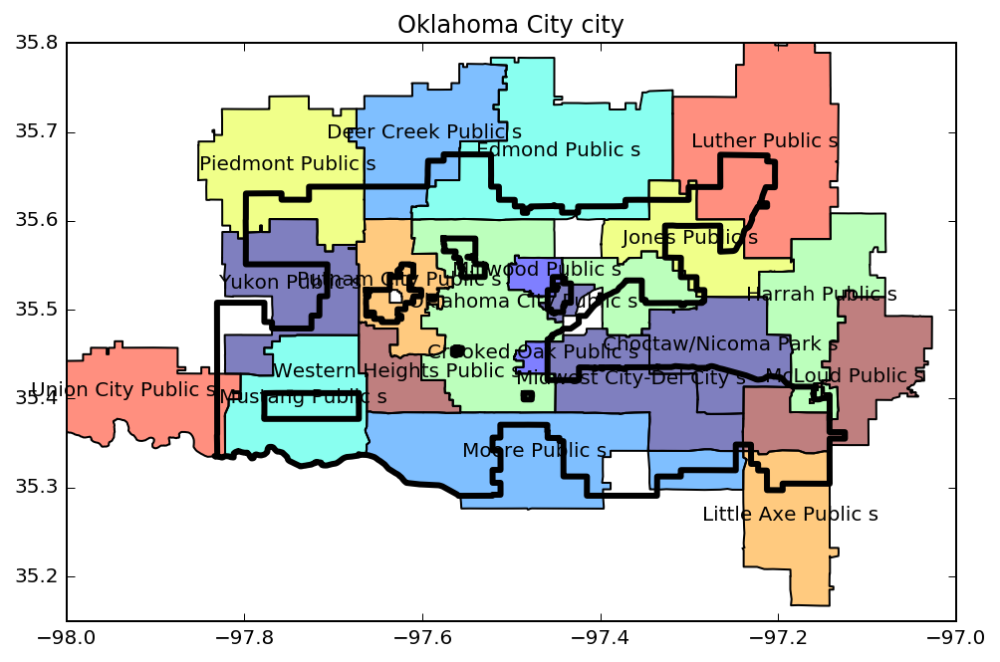

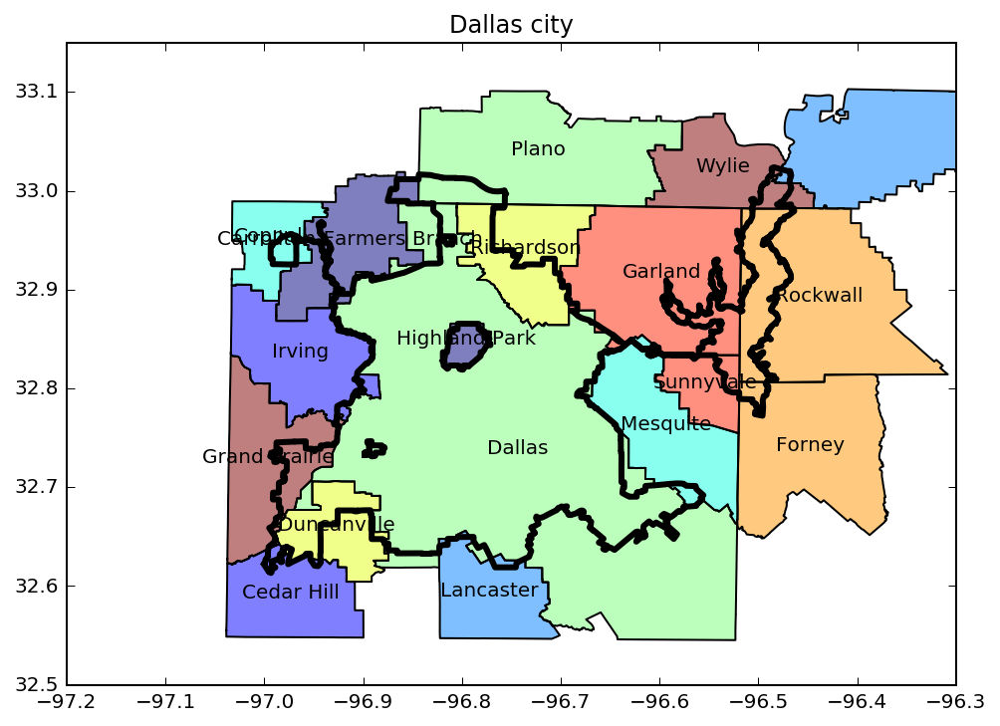

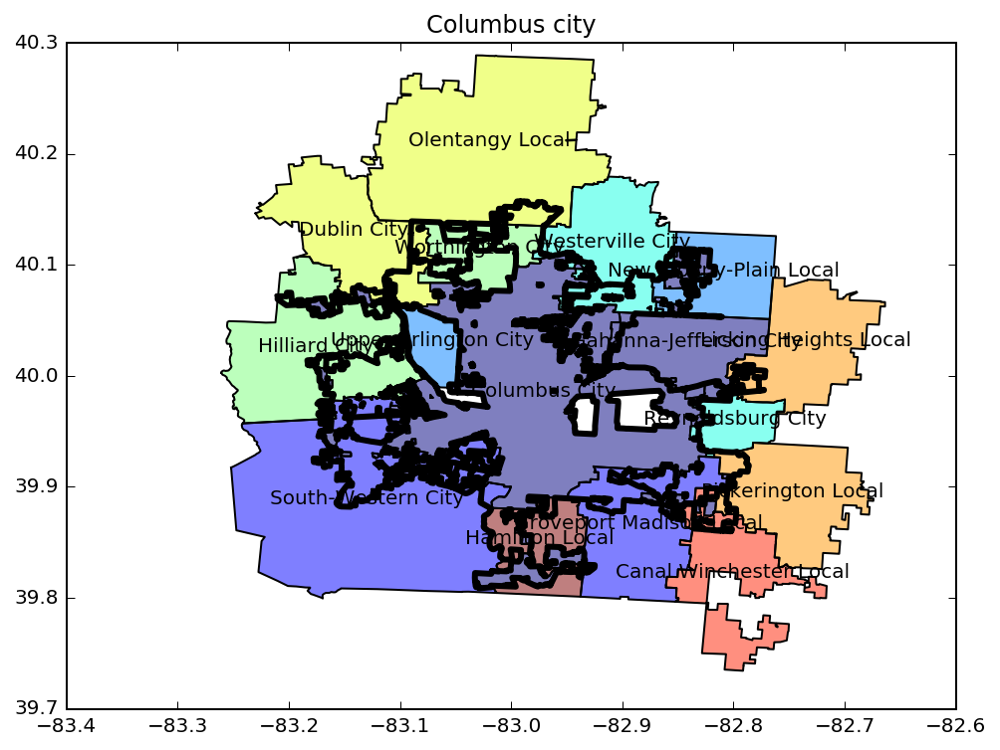

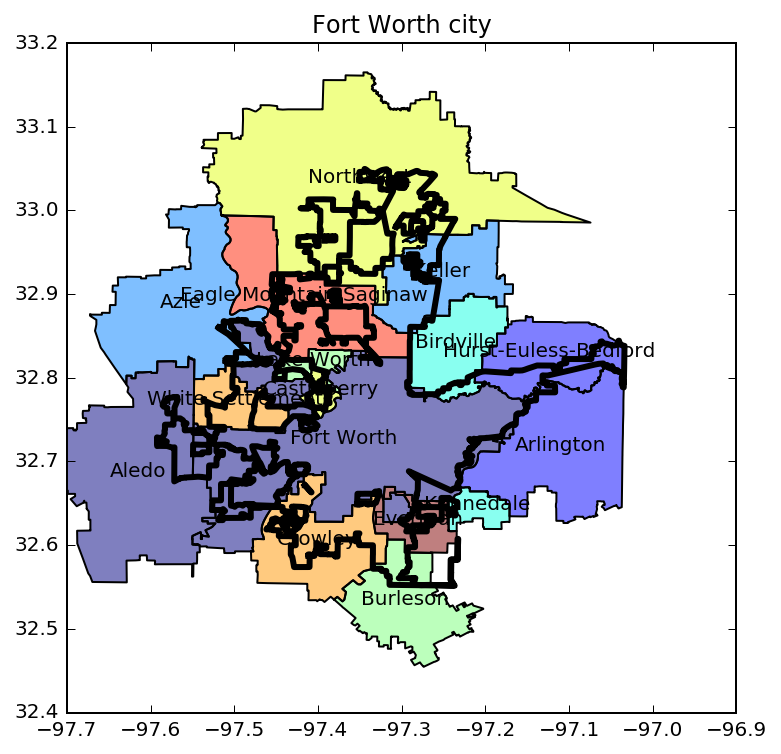

...

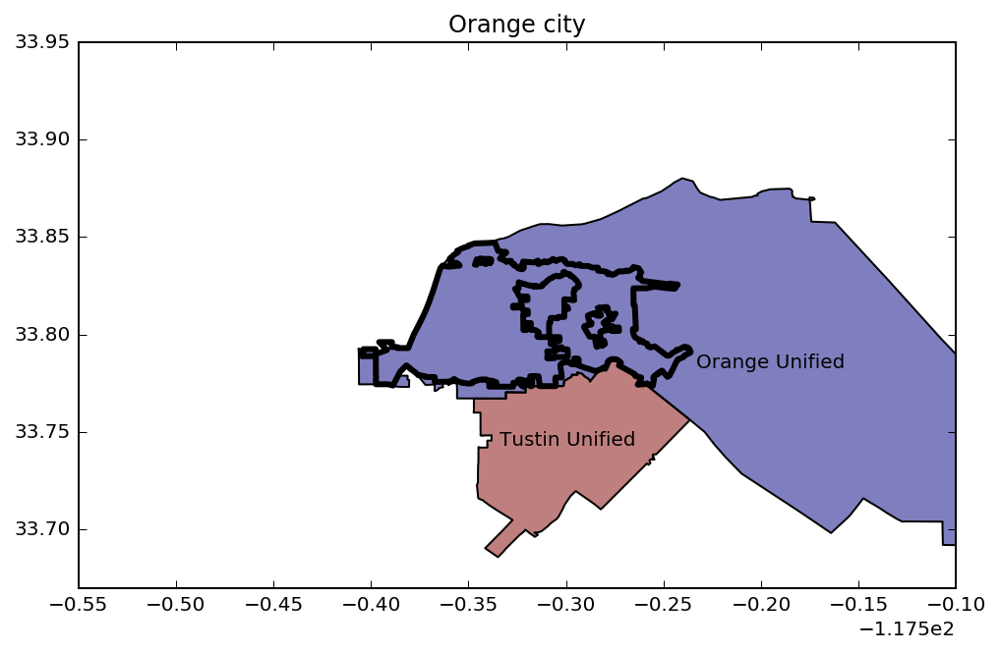

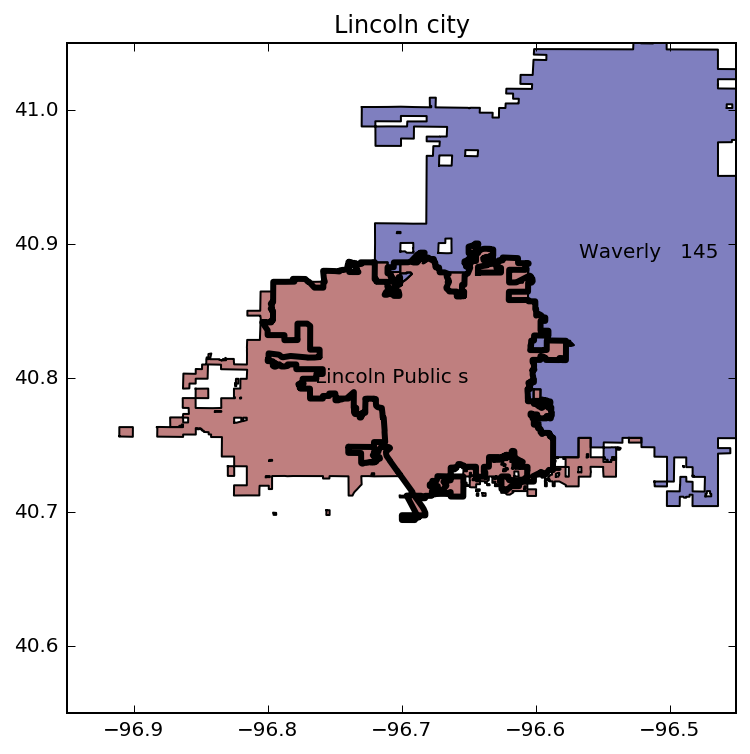

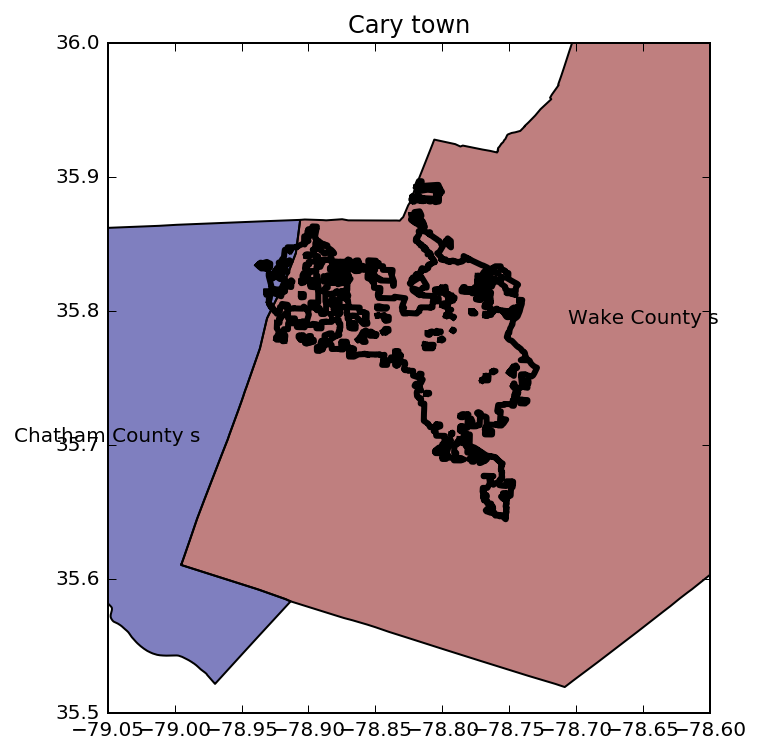

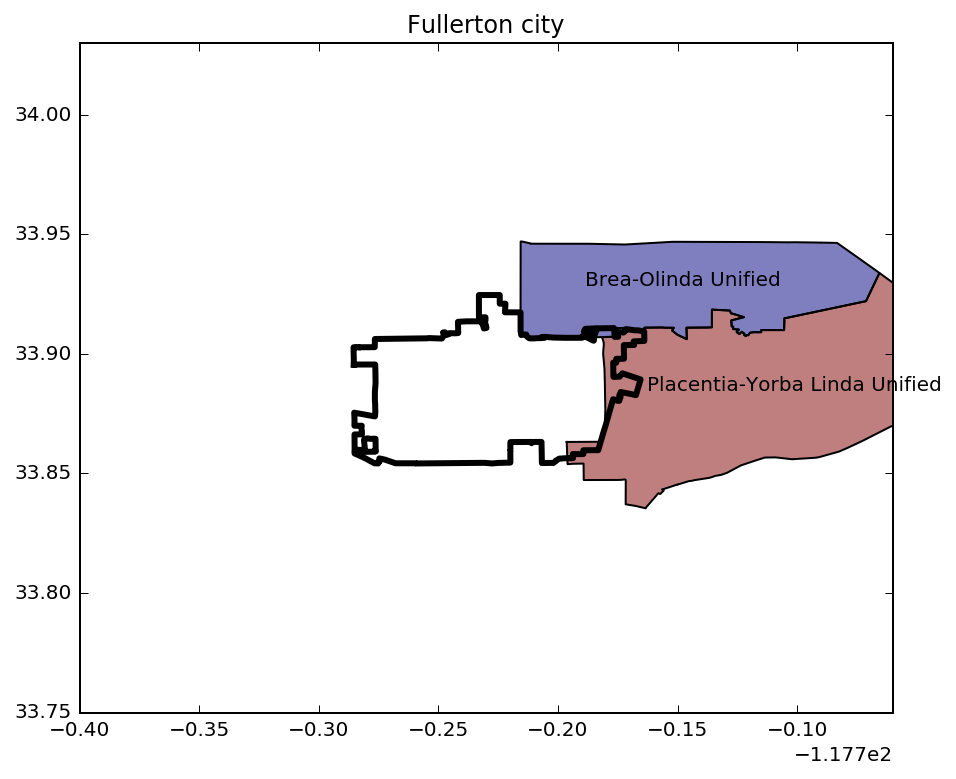

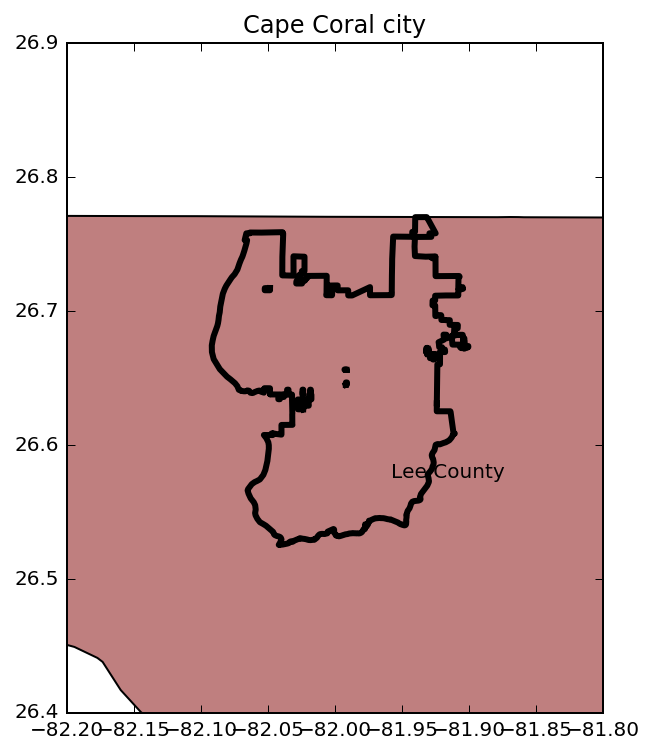

In [48]:
for name in ndist_df.NAME[:107]:
    city=cities[cities.NAMELSAD10==name].iloc[0:1]
    plot_city(city)
    plt.title(name)
    

## Tucson

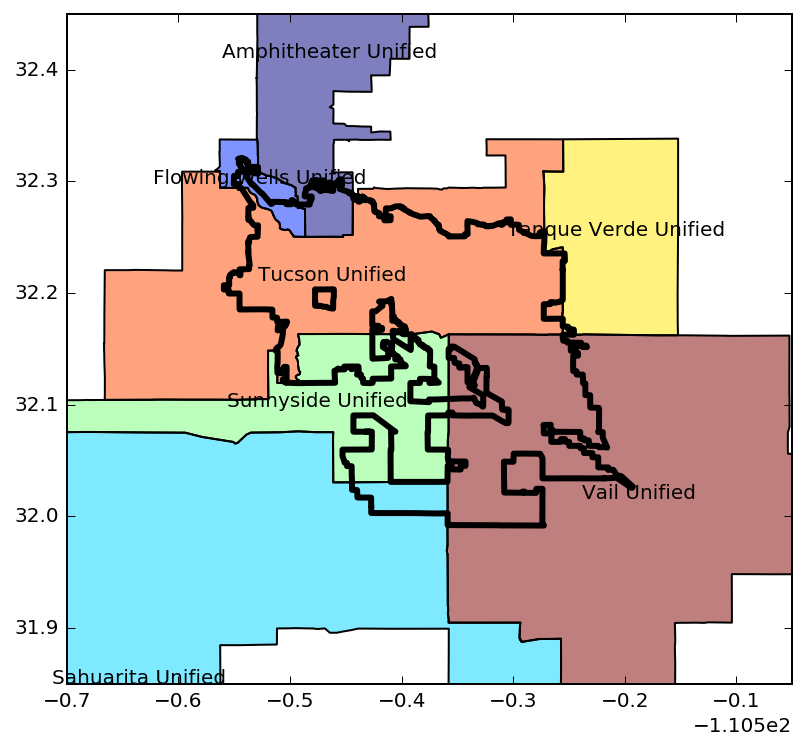

In [49]:
tucson=cities[cities.NAMELSAD10=="Tucson city"].iloc[0:1]
plot_city(tucson)

In [51]:
tucons_sales2015=pd.read_csv("/Users/imolk/Documents/Harvard/Miratrix/rdd-coverage/Maxime/Tucson_data/SALE2015/Sale2015.csv")

In [53]:
set(tucons_sales2015.PropertyType)

{'2-4 Plex',
 'Agricultural',
 'Apartment Building',
 'Commercial/Industrial',
 'Condo/Townhouse',
 'Mobile Home',
 'Other',
 'Single Family',
 'Vacant Land'}

In [56]:
set(tucons_sales2015.Deed)

{'Contract or Agreement',
 'Joint Tenancy Deed',
 'Other',
 'Quit Claim Deed',
 'Warranty Deed'}

In [59]:
set(tucons_sales2015.IntendedUse)

{'NonPrimary', 'PrimaryRes', 'Rental', 'Unknown'}

In [54]:
tucons_sales2015.columns

Index(['Parcel', 'SequenceNum', 'SaleDate', 'SalePrice', 'PropertyType',
       'IntendedUse', 'Deed', 'Financing', 'ValidationDescription',
       'BuyerSellerRelated', 'Solar', 'PersonalProperty', 'PartialInterest',
       'RecordingDate'],
      dtype='object')

In [61]:
tucons_sales2015

,Parcel,SequenceNum,SaleDate,SalePrice,PropertyType,IntendedUse,Deed,Financing,ValidationDescription,BuyerSellerRelated,Solar,PersonalProperty,PartialInterest,RecordingDate
0,115150340,20150020054,201501,485000,Commercial/Industrial,Unknown,Warranty Deed,Cash,More than five (5) parcels being sold,No,No,No,No,2015-01-02
1,115150350,20150020054,201501,485000,Commercial/Industrial,Unknown,Warranty Deed,Cash,More than five (5) parcels being sold,No,No,No,No,2015-01-02
2,115150360,20150020054,201501,485000,Commercial/Industrial,Unknown,Warranty Deed,Cash,More than five (5) parcels being sold,No,No,No,No,2015-01-02
3,115150370,20150020054,201501,485000,Commercial/Industrial,Unknown,Warranty Deed,Cash,More than five (5) parcels being sold,No,No,No,No,2015-01-02
4,115150380,20150020054,201501,485000,Commercial/Industrial,Unknown,Warranty Deed,Cash,More than five (5) parcels being sold,No,No,No,No,2015-01-02
5,115150390,20150020054,201501,485000,Commercial/Industrial,Unknown,Warranty Deed,Cash,More than five (5) parcels being sold,No,No,No,No,2015-01-02
6,306100920,20150020096,201501,300000,Mobile Home,NonPrimary,Warranty Deed,Cash,Buyer/Seller has an Out-Of-State Address,No,No,No,No,2015-01-02
7,116032760,20150020101,201501,125000,Condo/Townhouse,PrimaryRes,Warranty Deed,Cash,Good Sale,No,No,No,No,2015-01-02
8,217530800,20150020106,201501,132000,Single Family,NonPrimary,Warranty Deed,Other,Buyer/Seller has an Out-Of-State Address,No,No,No,No,2015-01-02
9,121016490,20150020271,201501,1565000,Commercial/Industrial,Unknown,Warranty Deed,Cash,Buyer/Seller has an Out-Of-State Address,No,No,No,No,2015-01-02


In [70]:
adparcel=gpd.read_file("Tucson_data/adparcel/adparcel.shp")
adparcel.set_index("PARCEL", inplace=True)
adparcel

,ADDRESS,ADPARCEL_,ADPARCEL_I,ADR_ID,AD_STREET,AD_SUFFIX,ANGLE,AREA,CITY_ID,CODE,...,STREET_IDX,STREET_NAM,STREET_NO,SUFFIX_DIR,TILE_NAME,X_HPGN,Y_HPGN,ZIPCITY,ZIPCODE,geometry
PARCEL,,,,,,,,,,,,,,,,,,,,,
205180070,16755 N SAN PEDRO RIVER RD,1,401834,399135,SAN PEDRO RIVER,RD,0.0,0.0,PC,0,...,SAN P,SAN PEDRO RIVER RD,16755,None,E111803,1136229,553229,BENSON,85602,POINT (-110.5015370083297 32.51293765280276)
205180060,16770 N SAN PEDRO RIVER RD,2,401833,399134,SAN PEDRO RIVER,RD,0.0,0.0,PC,0,...,SAN P,SAN PEDRO RIVER RD,16770,None,E111803,1137108,552937,BENSON,85602,POINT (-110.4986984585252 32.51210417083396)
205180080,16701 N SAN PEDRO RIVER RD,3,401832,399133,SAN PEDRO RIVER,RD,0.0,0.0,PC,0,...,SAN P,SAN PEDRO RIVER RD,16701,None,E111803,1136288,552639,BENSON,85602,POINT (-110.5013702394749 32.51131556879015)
20518018C,16480 N SAN PEDRO RIVER RD,4,401831,399132,SAN PEDRO RIVER,RD,0.0,0.0,PC,0,...,SAN P,SAN PEDRO RIVER RD,16480,None,E111803,1138621,552021,BENSON,85602,POINT (-110.4938312862861 32.5095316372407)
20518011A,16453 N SAN PEDRO RIVER RD,5,401830,399131,SAN PEDRO RIVER,RD,0.0,0.0,PC,0,...,SAN P,SAN PEDRO RIVER RD,16453,None,E111803,1137179,551919,BENSON,85602,POINT (-110.4985109148162 32.50930379798557)
20518014A,16430 N SAN PEDRO RIVER RD,6,401829,399130,SAN PEDRO RIVER,RD,0.0,0.0,PC,0,...,SAN P,SAN PEDRO RIVER RD,16430,None,E111803,1137792,551522,BENSON,85602,POINT (-110.4965401193143 32.50818922906361)
20518018B,16660 N SAN PEDRO RIVER RD,7,401828,399129,SAN PEDRO RIVER,RD,0.0,0.0,PC,0,...,SAN P,SAN PEDRO RIVER RD,16660,None,E111803,1139461,551370,BENSON,85602,POINT (-110.4911349778097 32.50771221867262)
222010130,6010 E EDWIN RD,8,401827,399128,EDWIN,RD,0.0,0.0,PC,0,...,EDWIN,EDWIN RD,6010,None,E111401,1024173,551340,TUCSON,85739,POINT (-110.8650436327223 32.51130955012594)
222040370,16777 N SWAN RD,9,401826,399127,SWAN,RD,0.0,0.0,PC,0,...,SWAN,SWAN RD,16777,None,E111403,1015418,551268,TUCSON,85739,POINT (-110.8934462426618 32.51134639442088)


In [105]:
adparcel.ix["205180070"]

ADDRESS                         16755 N SAN PEDRO RIVER RD
ADPARCEL_                                                1
ADPARCEL_I                                          401834
ADR_ID                                              399135
AD_STREET                                  SAN PEDRO RIVER
AD_SUFFIX                                               RD
ANGLE                                                    0
AREA                                                     0
CITY_ID                                                 PC
CODE                                                     0
DATE_ENTER                                      2000-05-02
LAT                                                32.5129
LON                                               -110.502
PERIMETER                                                0
POLYGONID                                                1
SCALE                                                    1
SOURCE                                          PC DSD G

In [90]:
adparcelarcel.columns

Index(['ADDRESS', 'ADPARCEL_', 'ADPARCEL_I', 'ADR_ID', 'AD_STREET',
       'AD_SUFFIX', 'ANGLE', 'AREA', 'CITY_ID', 'CODE', 'DATE_ENTER', 'LAT',
       'LON', 'PERIMETER', 'POLYGONID', 'SCALE', 'SOURCE', 'STATUS', 'STREET',
       'STREET_DIR', 'STREET_IDX', 'STREET_NAM', 'STREET_NO', 'SUFFIX_DIR',
       'TILE_NAME', 'X_HPGN', 'Y_HPGN', 'ZIPCITY', 'ZIPCODE', 'geometry'],
      dtype='object')

In [85]:
tucons_sales2015[tucons_sales2015.PropertyType=="Single Family"].Parcel.iloc[0]

'217530800'

In [108]:
TC_sales_geocoded=tucons_sales2015.set_index("Parcel")
TC_sales_geocoded=pd.merge(TC_sales_geocoded, adparcel, how="left", left_index=True, right_index=True)

In [122]:
notnan = np.logical_not(TC_sales_geocoded.geometry.isnull().values)

In [96]:
tucson_parcels = adparcel.within(tucson.geometry.values[0])

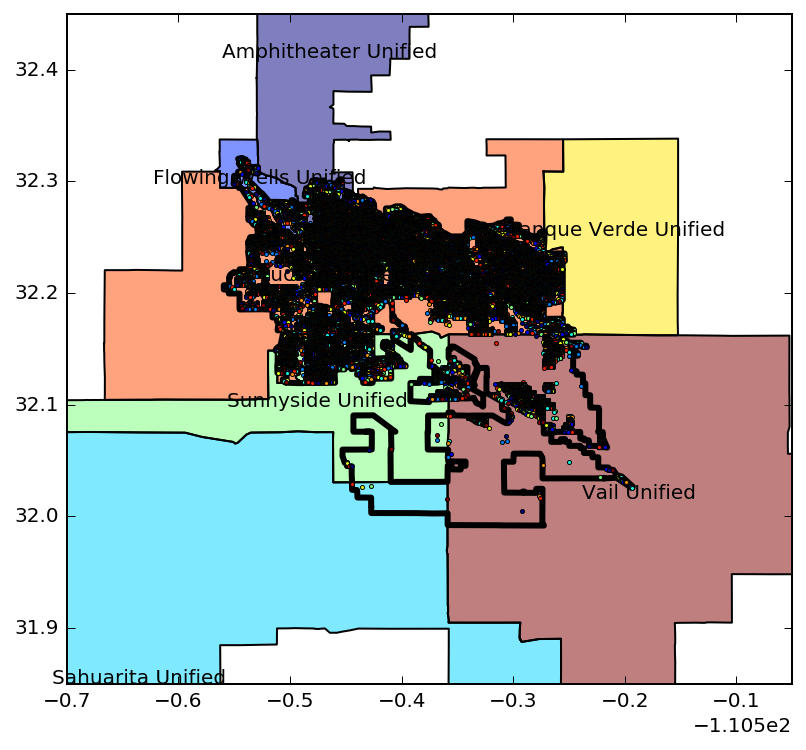

In [100]:
plot_city(tucson)
plot_dataframe(adparcel[tucson_parcels].to_crs(tucson.crs), ax=plt.gca())

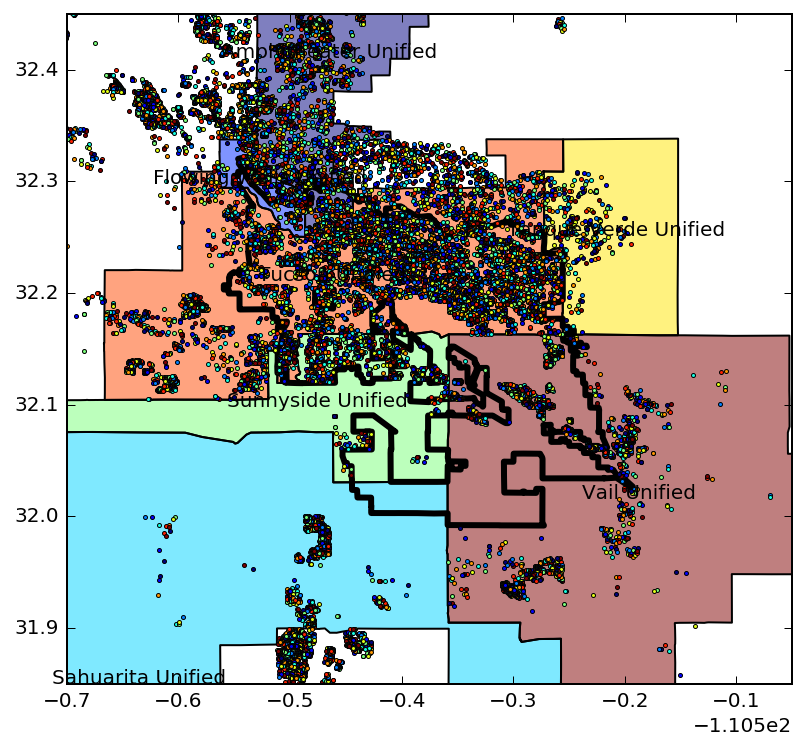

In [123]:
plot_city(tucson)
plot_dataframe(TC_sales_geocoded[notnan], ax=plt.gca(), color="black", alpha=0.5)

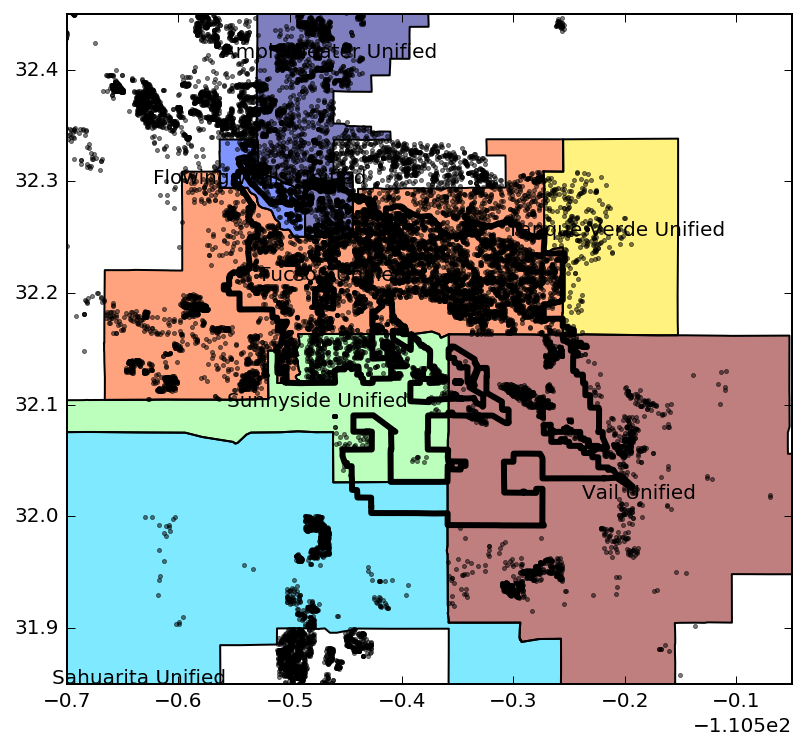

In [124]:
plot_city(tucson)
plot_dataframe(TC_sales_geocoded[notnan], ax=plt.gca(), color="black", alpha=0.5)